# Analysis of the screening results
---

This notebook evaluates the results of the specificity screen. For the screen we trained an Ensemble of two Resnet18 pretrained on the Imagenet data set that processed the individual single-nuclei images as well as whole FoV images. The latter model can use the whole FoV images to also derive distributional information like e.g. the cell density that might be helpful to distinguish the negative control setting from the OE condition. Note that while the illumination has been corrected for there might still be related artifacts that the model potential could overfit on.

First, single nuclei and FoV images are scaled by subtracting the 0.1 percentile and dividing the image by the 99.9 percentile to make the images comparable and limit the influence of oversaturated artifacts. The images are clipped such that the values are within 0,1 respectively 0, 255 after rescaling the images to 8-bit integer range.

We augmented the single nuclei images by resizing them from 96x96 to 224x224 and randomly flipping them horizontally and vertically before forming pseudo-RGB images and normalizing those using the mean and standard deviations of the ImageNet data set. 

Additionally for each nuclei we obtained the corresponding FoV image by cropping the 1080x1080 centered around the nuclei for a patch size of 448x448. If required the FoV image is padded with the lower percentile value before. The crops are then also randomly flipped during training, transformed into pseudo-RGBs and normalized.


In this notebook, we will first compare the model with the results of a similar screen run only on the single-nuclei images processed as described above by a pretrained ResNet18 model. Second, we will compare the results of such screen using the morphological embeddings computed by the authors of the original publication. Third, using a automatic approach we will identify a subset of OE conditions that yield to a reproducible and specific structural phenotype in the cell populations different from the negative controls by thresholding a defined specificity score.
The final evaluation of the selected set of OE condition targets will conclude this analysis.

## 0. Environmental setup

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
import venn
from typing import List
from umap import UMAP
import os

from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE

from statannot import add_stat_annotation

import sys

sys.path.append("../../../")

from src.utils.basic.io import get_file_list
from src.utils.notebooks.images.exp_evaluation import analyze_screen_results

%load_ext nb_black
%autosave 60

Autosaving every 60 seconds


<IPython.core.display.Javascript object>

In [2]:
def plot_spec_screen_results(
    root_dir: str,
    dataset_types: List[str],
    score_df: pd.DataFrame,
    label_col: str = "labels",
    figsize=[12, 6],
):
    subdirs = sorted(os.listdir(root_dir))
    print(subdirs)
    for subdir in tqdm(subdirs, desc="Visualize latent spaces"):
        fig, ax = plt.subplots(ncols=len(dataset_types), figsize=figsize)
        ax = ax.flatten()
        all_latents = []
        all_labels = []
        dataset_labels = []
        for i in range(len(dataset_types)):
            dataset_type = dataset_types[i]
            latents = pd.read_hdf(
                os.path.join(root_dir, subdir, dataset_type + "_latents.h5")
            )
            all_labels.append(
                np.array(
                    latents.loc[:, "labels"].map(
                        dict(zip([0, 1], sorted(["EMPTY", subdir.upper()])))
                    )
                )
            )
            all_latents.append(np.array(latents.drop(columns=[label_col])))
            dataset_labels.extend([dataset_type] * len(latents))

        all_latents = np.concatenate(all_latents)
        all_labels = np.concatenate(all_labels)
        all_embs = TSNE(random_state=1234).fit_transform(all_latents)
        all_embs = pd.DataFrame(all_embs, columns=["tsne_0", "tsne_1"])
        all_embs["label"] = all_labels
        all_embs["dataset_type"] = np.array(dataset_labels)

        for i in range(len(dataset_types)):
            dataset_type = dataset_types[i]
            ax[i] = sns.scatterplot(
                data=all_embs.loc[all_embs["dataset_type"] == dataset_type],
                x="tsne_0",
                y="tsne_1",
                hue="label",
                ax=ax[i],
                hue_order=["EMPTY", subdir.upper()],
                s=4,
            )
            score = score_df.loc[subdir.upper(), "{}_acc".format(dataset_type)]
            ax[i].set_title("{} data, acc: {:.4f}".format(dataset_type, score))
            ax[i].set_xlim([all_embs.tsne_0.min() - 20, all_embs.tsne_0.max() + 20])
            ax[i].set_ylim([all_embs.tsne_1.min() - 20, all_embs.tsne_1.max() + 20])

        fig.suptitle("Latent embeddings for {}".format(subdir))
        plt.show()
        plt.close()

<IPython.core.display.Javascript object>

In [3]:
cell_cycle_genes = set(
    pd.read_csv(
        "../../../data/other/reactome_cell_cycle.txt", index_col=0, header=None
    ).index
)
chrom_org_genes = set(
    pd.read_csv(
        "../../../data/other/reactome_chrom_org.txt", index_col=0, header=None
    ).index
)
dna_repair_genes = set(
    pd.read_csv(
        "../../../data/other/reactome_dna_repair.txt", index_col=0, header=None
    ).index
)
reg_actin_cytoskeleton_genes = set(
    pd.read_csv(
        "../../../data/other/kegg_reg_act_cytoskeleton.txt", index_col=0, header=None
    ).index
)
human_tfs = set(
    list(
        pd.read_csv(
            "../../../data/other/human_tf_list.txt", index_col=0, header=None
        ).index
    )
)
curated_gene_sets = (
    cell_cycle_genes.union(chrom_org_genes)
    .union(dna_repair_genes)
    .union(reg_actin_cytoskeleton_genes)
    .union(human_tfs)
)

<IPython.core.display.Javascript object>

---

## 1. Read in data

First, we will read in the data which automatically scans the given directories of the individual screens for the corresponding log-files and extract the different scores from those.

In [4]:
screen_results_multi_image = analyze_screen_results(
    "../../../data/experiments/image_embeddings/nuclei_fov_screen"
)
screen_results_nuclei = analyze_screen_results(
    "../../../data/experiments/image_embeddings/nuclei_screen"
)

<IPython.core.display.Javascript object>

In [5]:
screen_results_multi_image

,target,train_loss,val_loss,test_loss,train_acc,val_acc,test_acc
0,ACVR1B,0.546991,0.624137,0.952177,0.713726,0.675781,0.443299
1,ADAM17,0.649584,0.887403,0.820558,0.607955,0.503571,0.485518
2,AKT1,0.418882,0.667287,0.562138,0.795401,0.730222,0.719583
3,AKT1S1,0.519081,0.959082,0.518187,0.737660,0.687966,0.711578
4,AKT2,0.336788,1.105856,0.479685,0.855617,0.604911,0.802885
...,...,...,...,...,...,...,...
184,WNT5A,0.536901,0.864992,0.695978,0.718473,0.628906,0.596154
185,WWTR1,0.442417,0.443488,0.762805,0.792883,0.809896,0.629076
186,XBP1,0.539542,0.707455,0.898957,0.720328,0.609990,0.513597
187,XIAP,0.410841,0.840378,1.012122,0.811553,0.656250,0.551270


<IPython.core.display.Javascript object>

We compute a specificity score that is the minimum of the validation and testing accuracy for each screen and target. This is because that we observed quite some differences in the data distribution in the validation and test sets which led sometimes to artificially higher test scores just by chance.

In [6]:
screen_results_multi_image["min_val_test_acc"] = [
    np.min(screen_results_multi_image.iloc[i, -2:])
    for i in range(len(screen_results_multi_image))
]
screen_results_nuclei["min_val_test_acc"] = [
    np.min(screen_results_nuclei.iloc[i, -2:])
    for i in range(len(screen_results_nuclei))
]

<IPython.core.display.Javascript object>

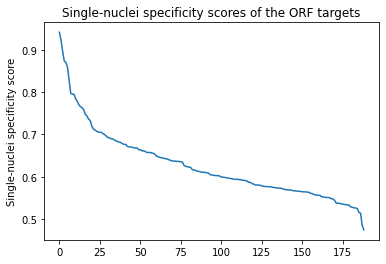

<IPython.core.display.Javascript object>

In [7]:
spec_scores = np.array(
    screen_results_nuclei.sort_values(
        "min_val_test_acc", ascending=False
    ).min_val_test_acc
)
index = np.array(list(range(len(spec_scores))))
plt.plot(index, spec_scores)
plt.xlabel("")
plt.ylabel("Single-nuclei specificity score")
plt.title("Single-nuclei specificity scores of the ORF targets")
plt.show()

Next, we will save the data to disk for further analyses.

In [9]:
screen_results_multi_image.to_csv(
    "../../../data/experiments/image_embeddings/nuclei_fov_screen/screen_results.csv"
)
screen_results_nuclei.to_csv(
    "../../../data/experiments/image_embeddings/nuclei_screen/screen_results.csv"
)

<IPython.core.display.Javascript object>

---

## 2. Comparison of the screens

As a first step we will compare the results of the two screens to see how much additional information is provided by the FoV images that is signal for the separability.

In [8]:
common_targets = set(screen_results_multi_image.target).intersection(
    set(screen_results_nuclei.target)
)
comp_results = pd.DataFrame()
screen_results_multi_image.index = screen_results_multi_image.target
screen_results_nuclei.index = screen_results_nuclei.target
comp_results["multi_image_spec_score"] = screen_results_multi_image.loc[
    common_targets, "min_val_test_acc"
]
comp_results["nuclei_image_spec_score"] = screen_results_nuclei.loc[
    common_targets, "min_val_test_acc"
]
comp_results.index = common_targets
comp_results.head()

,multi_image_spec_score,nuclei_image_spec_score
ELK1,0.779605,0.762784
ERN1,0.482515,0.575521
CDK4,0.595313,0.613095
SGK3,0.420673,0.552484
CASP9,0.583882,0.602796


<IPython.core.display.Javascript object>

Interestingly, we find that the obtained specificity scores do not reflect that the fact that some models get strictly more information as input as for some ORF targets the single-nuclei model performs better. This suggests that for those cases some spurious noise must be present in parts of the training and validation set that the model starts to overfit on when having access to such kind of information in form of the FoV well images.

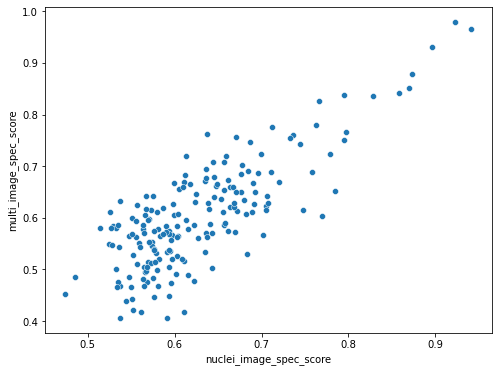

<IPython.core.display.Javascript object>

In [9]:
fig, ax = plt.subplots(figsize=[8, 6])
ax = sns.scatterplot(
    data=comp_results, x="nuclei_image_spec_score", y="multi_image_spec_score"
)

Nonetheless, the performance scores are correlated with a Pearson r of above 0.6346.

In [10]:
from scipy.stats import pearsonr

pearsonr(
    comp_results.loc[:, "nuclei_image_spec_score"],
    comp_results.loc[:, "multi_image_spec_score"],
)

(0.7994220731437952, 5.037714257137801e-43)

<IPython.core.display.Javascript object>

We will now look a little bit more in depth at those cases. Among the top-10 ORF targets with respect to the specificity score for the setup only using the single-nuclei images, there are two for which the multi-image setups yield specificity scores of which are ca. 5% less. These three targets are GLI1 and TSC2.

In [11]:
comp_results.sort_values("nuclei_image_spec_score", ascending=False).head(10)

,multi_image_spec_score,nuclei_image_spec_score
CASP8,0.964844,0.941406
JUN,0.980000,0.922500
CEBPA,0.931386,0.896060
CDKN1A,0.878676,0.873162
ERG,0.851351,0.870313
HRAS,0.840774,0.858631
RAF1,0.836097,0.827806
CREB1,0.765625,0.796875
CXXC4,0.838542,0.795139
PRKACA,0.751116,0.794643


<IPython.core.display.Javascript object>

The opposite does not hold true for the targets, where the model trained on the single nuclei and the FoV images perform best. Many of those were identified to have a toxic or potential toxic effect like JUN and CASP8. Among the top 10 targets for none of those the single nuclei model yielded a higher specificity score.

In [14]:
comp_results.sort_values("multi_image_spec_score", ascending=False).head(10)

,multi_image_spec_score,nuclei_image_spec_score
JUN,0.980000,0.719375
CASP8,0.964844,0.667969
CEBPA,0.931386,0.661005
CDKN1A,0.878676,0.670956
ERG,0.851351,0.623311
HRAS,0.840774,0.706845
CXXC4,0.838542,0.597222
RAF1,0.836097,0.649235
SMAD4,0.825721,0.747596
ELK1,0.779605,0.647727


<IPython.core.display.Javascript object>

---

## 3. Specificity analyses

To provide validation for our specificity screening we will next compare our results with those from the study by Rohban et al (2017) from which we have taken the imaging data. The authors looked at single alleles and not genes and assessed the specificity differently from our approach. Nonetheless, the 110 alleles corresponding to 76 different genes that they identified to give a specific and consistent morphological profile upon over-expression also yield on average a higher specificity score as seen in the histogram below. 

To this end, we will define the final specificity score for each target as the maximum of the single nuclei and the multi-image score of our model and plot the distribution of those scores for the 76 genes that Rohban et al identified and the remaining genes below.

In [15]:
spec_results = comp_results.copy()
spec_results["spec_score"] = [
    np.max(spec_results.iloc[i, -2:]) for i in range(len(spec_results))
]

<IPython.core.display.Javascript object>

In [15]:
rohban_specific_orf_targets = set(
    pd.read_csv(
        "../../../data/other/rhoban_specific_orf_targets.txt", index_col=0
    ).index
)

<IPython.core.display.Javascript object>

In [ ]:
spec_results["rohban_selected"] = np.array(
    spec_results.index.isin(rohban_specific_orf_targets)
).astype("str")

spec_results["pathways_of_interest"] = np.array(
    spec_results.index.isin(curated_gene_sets)
).astype("str")

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

False v.s. True: Mann-Whitney-Wilcoxon test smaller with Bonferroni correction, P_val=1.267e-03 U_stat=3.128e+03


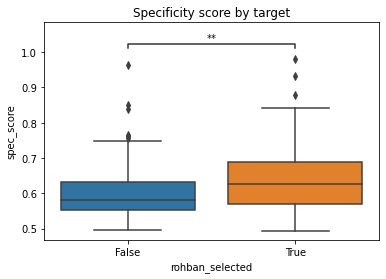

<IPython.core.display.Javascript object>

In [17]:
ax = sns.boxplot(data=spec_results, y="spec_score", x="rohban_selected")
add_stat_annotation(
    ax,
    data=spec_results,
    x="rohban_selected",
    y="spec_score",
    box_pairs=[("False", "True")],
    test="Mann-Whitney-ls",
    text_format="star",
    loc="inside",
    verbose=1,
)
plt.title("Specificity score by target")
plt.show()

We see that the score is significantly smaller for the targets identified as yielding an inconsistent or unspecific structural phenotype in the overexpression condition.

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

False v.s. True: Mann-Whitney-Wilcoxon test smaller with Bonferroni correction, P_val=4.861e-04 U_stat=3.121e+03


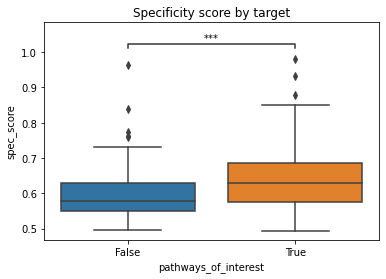

<IPython.core.display.Javascript object>

In [18]:
ax = sns.boxplot(
    data=spec_results, y="spec_score", x="pathways_of_interest", order=["False", "True"]
)
add_stat_annotation(
    ax,
    data=spec_results,
    x="pathways_of_interest",
    y="spec_score",
    box_pairs=[("False", "True")],
    test="Mann-Whitney-ls",
    text_format="star",
    order=["False", "True"],
    loc="inside",
    verbose=1,
)
plt.title("Specificity score by target")
plt.show()

---

## 4. Selecting specific ORF targets

The specificity screen was intended to identify the specific ORF targets that are most useful for our downstream analyses when aiming to link the structural and regulatory space using these targets as anchor points.

### 4.1. Specificity score

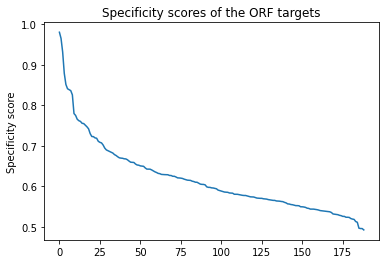

<IPython.core.display.Javascript object>

In [19]:
spec_scores = np.array(
    spec_results.sort_values("spec_score", ascending=False).spec_score
)
index = np.array(list(range(len(spec_scores))))
plt.plot(index, spec_scores)
plt.xlabel("")
plt.ylabel("Specificity score")
plt.title("Specificity scores of the ORF targets")
plt.show()

The plot above shows the sorted specificity scores for the individual ORF targets. The plot does not show any clear elbow but one might select 0.66 as the approximative location of that elbow. 44 ORF targets led to structural phenotype that could be distinguished from the healthy control with an accuracy of at least 66% on roughly balanced data set.

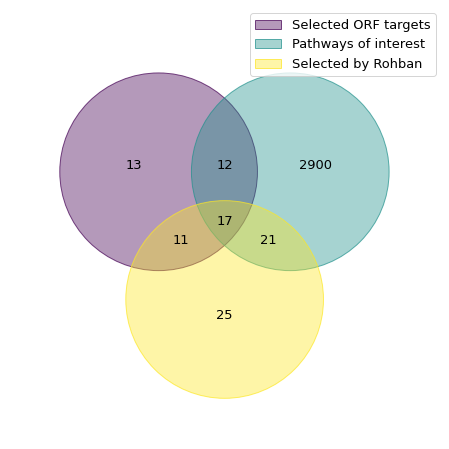

<IPython.core.display.Javascript object>

In [16]:
selected_targets = list(spec_results.loc[spec_results["spec_score"] >= 0.66].index)
ax = venn.venn(
    dict(
        zip(
            ["Selected ORF targets", "Pathways of interest", "Selected by Rohban"],
            [
                set(
                    selected_targets
                ),
                curated_gene_sets,
                rohban_specific_orf_targets,
            ],
        )
    )
)

In [18]:
set(
                    comp_results.loc[
                        comp_results["nuclei_image_spec_score"] > 0.7
                    ].index
                ) - rohban_specific_orf_targets

{'BRAF',
 'CASP8',
 'CREB1',
 'CXXC4',
 'DIABLO',
 'E2F1',
 'ERG',
 'IRAK4',
 'MAP3K5',
 'MAPK7',
 'MKNK1',
 'TSC2'}

<IPython.core.display.Javascript object>

In [21]:
sorted(selected_targets)

['AKT1',
 'AKT1S1',
 'ATF4',
 'ATG16L1',
 'ATG5',
 'BAMBI',
 'BAX',
 'BCL2L11',
 'BECN1',
 'BRAF',
 'CASP8',
 'CDC42',
 'CDK2',
 'CDKN1A',
 'CEBPA',
 'CREB1',
 'CSNK1E',
 'CXXC4',
 'DUSP1',
 'ELK1',
 'ERG',
 'GLI1',
 'HRAS',
 'IKBKB',
 'JAK2',
 'JUN',
 'KRAS',
 'MAP2K4',
 'MAP3K2',
 'MAP3K8',
 'MAP3K9',
 'MLST8',
 'PDPK1',
 'PRKACA',
 'RAF1',
 'RELB',
 'RHOA',
 'SMAD3',
 'SMAD4',
 'SMO',
 'SRC',
 'SREBF1',
 'TCF4',
 'TSC2']

<IPython.core.display.Javascript object>

### 4.2. Visualization of the embeddings


We will now look further at those targets 44 targets and visualize the derived latent spaces colored by their condition (overexpression respectively control) for the training, validation and test set.

In [22]:
spec_results["selected"] = False
spec_results.loc[sorted(selected_targets), "selected"] = True
spec_results.head()

,multi_image_spec_score,nuclei_image_spec_score,spec_score,rohban_selected,pathways_of_interest,selected
ARNTL,0.568750,0.519792,0.568750,False,True,False
IKBKB,0.685855,0.607730,0.685855,False,False,True
FGFR3,0.635980,0.615954,0.635980,False,True,False
MAP3K2,0.760204,0.594866,0.760204,True,False,True
PIK3CB,0.616693,0.556171,0.616693,True,True,False


<IPython.core.display.Javascript object>

In [23]:
spec_results.to_csv("../../../data/other/specificity_screen_results.csv")

<IPython.core.display.Javascript object>

['AKT1', 'AKT1S1', 'ATF4', 'ATG16L1', 'ATG5', 'BAMBI', 'BAX', 'BCL2L11', 'BECN1', 'BRAF', 'CASP8', 'CDC42', 'CDK2', 'CDKN1A', 'CEBPA', 'CREB1', 'CSNK1E', 'CXXC4', 'DUSP1', 'ELK1', 'ERG', 'HRAS', 'IKBKB', 'JAK2', 'JUN', 'KRAS', 'MAP2K4', 'MAP3K2', 'MAP3K8', 'MAP3K9', 'MLST8', 'PDPK1', 'PRKACA', 'RAF1', 'RELB', 'RHOA', 'SMAD3', 'SMAD4', 'SMO', 'SRC', 'SREBF1', 'TCF4', 'TSC2']


Visualize latent spaces:   0%|          | 0/43 [00:00<?, ?it/s]

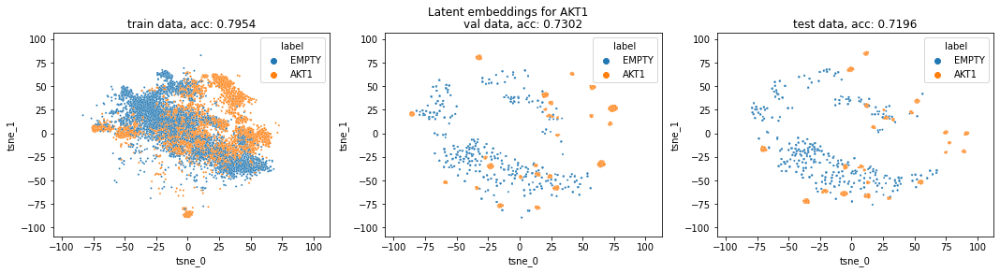

Visualize latent spaces:   2%|▏         | 1/43 [00:25<17:42, 25.30s/it]

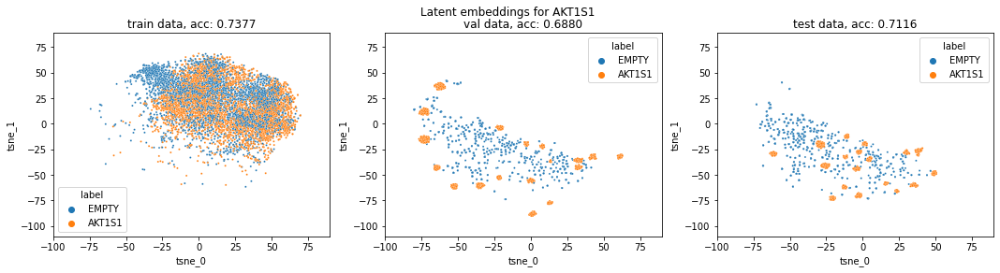

Visualize latent spaces:   5%|▍         | 2/43 [00:44<14:50, 21.73s/it]

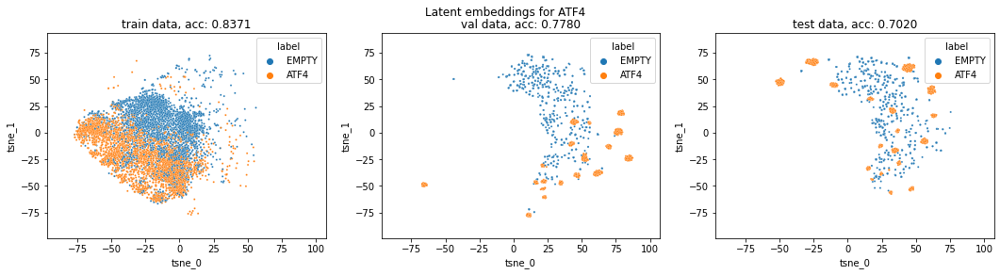

Visualize latent spaces:   7%|▋         | 3/43 [01:01<13:10, 19.77s/it]

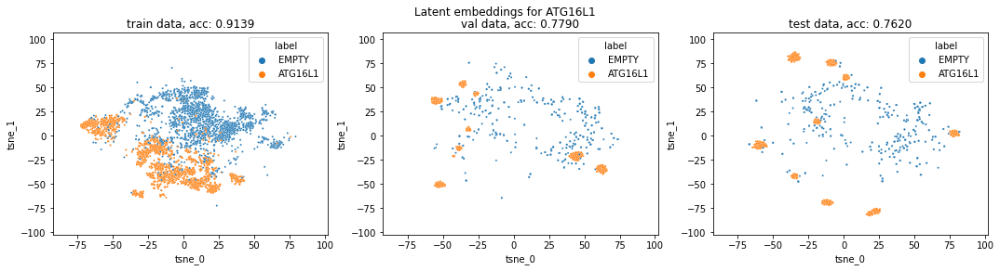

Visualize latent spaces:   9%|▉         | 4/43 [01:12<10:31, 16.18s/it]

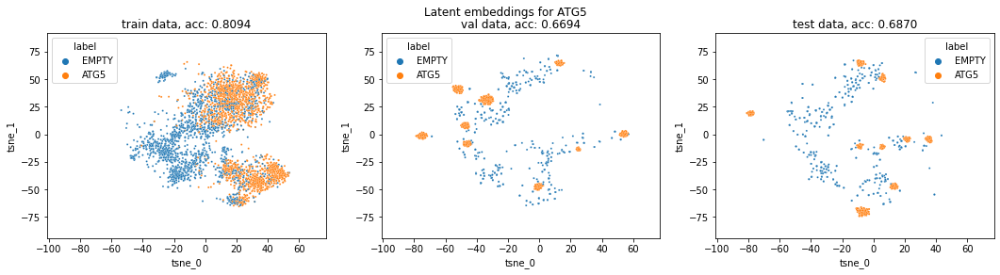

Visualize latent spaces:  12%|█▏        | 5/43 [01:22<08:43, 13.78s/it]

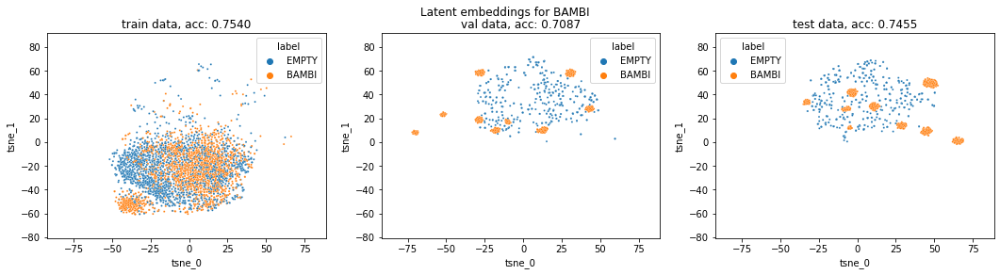

Visualize latent spaces:  14%|█▍        | 6/43 [01:31<07:38, 12.40s/it]

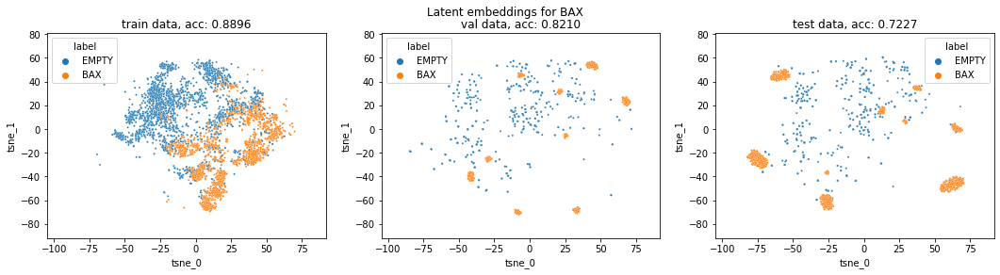

Visualize latent spaces:  16%|█▋        | 7/43 [01:42<07:02, 11.73s/it]

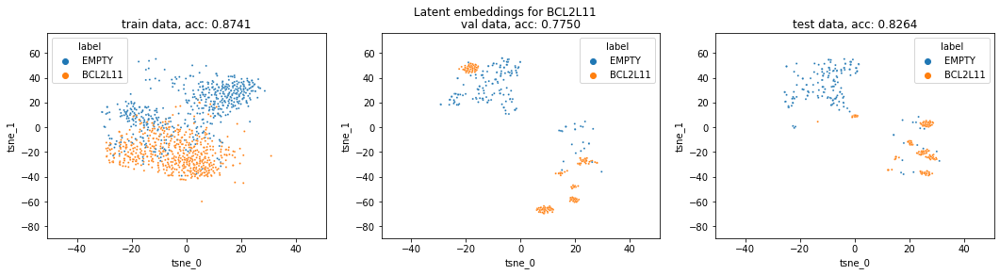

Visualize latent spaces:  19%|█▊        | 8/43 [01:45<05:15,  9.03s/it]

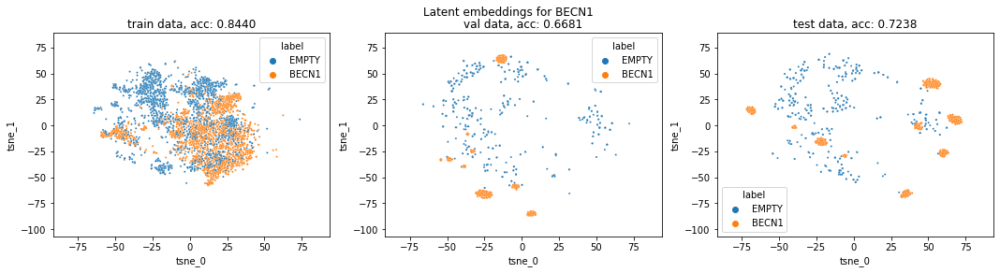

Visualize latent spaces:  21%|██        | 9/43 [01:55<05:17,  9.33s/it]

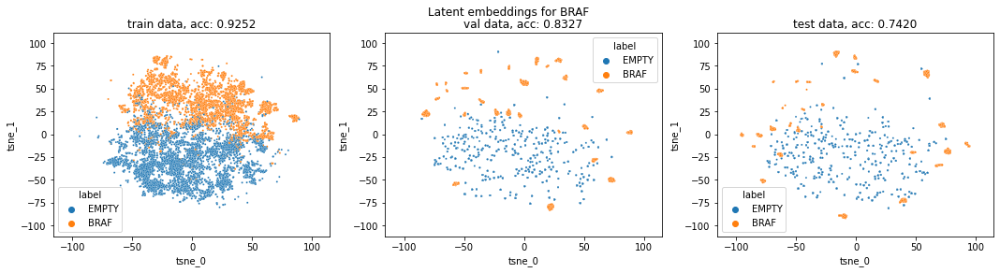

Visualize latent spaces:  23%|██▎       | 10/43 [02:23<08:22, 15.24s/it]

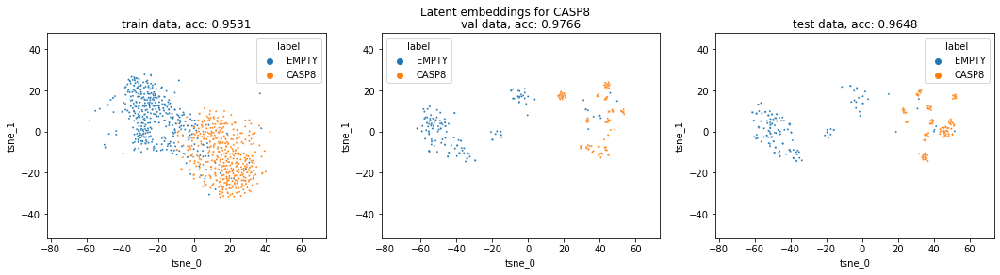

Visualize latent spaces:  26%|██▌       | 11/43 [02:26<06:06, 11.47s/it]

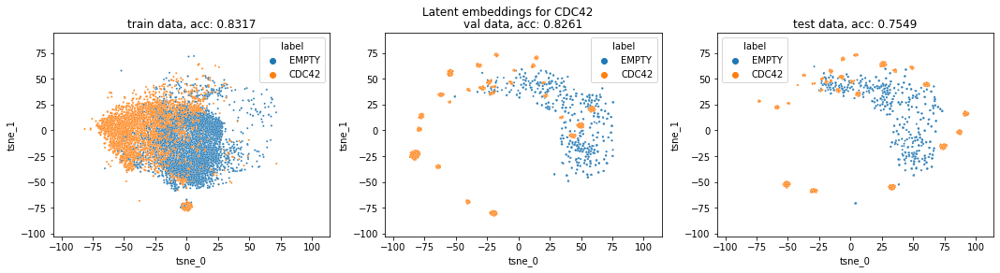

Visualize latent spaces:  28%|██▊       | 12/43 [02:49<07:44, 14.97s/it]

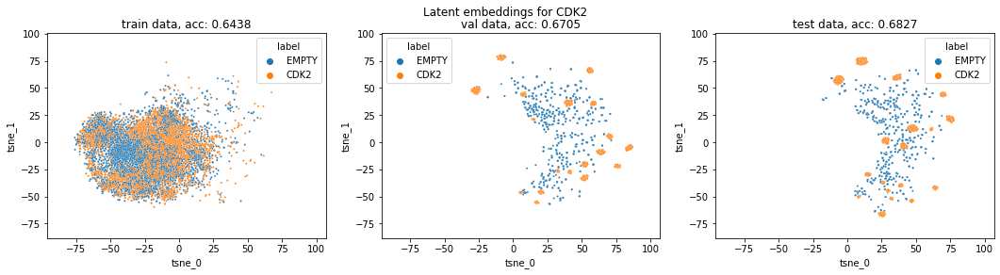

Visualize latent spaces:  30%|███       | 13/43 [03:11<08:33, 17.13s/it]

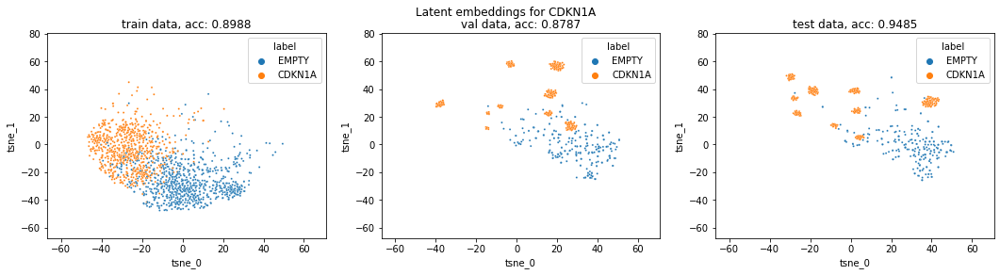

Visualize latent spaces:  33%|███▎      | 14/43 [03:16<06:26, 13.33s/it]

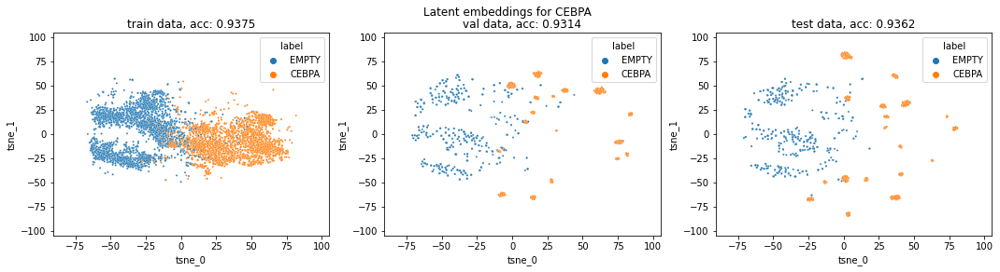

Visualize latent spaces:  35%|███▍      | 15/43 [03:30<06:17, 13.47s/it]

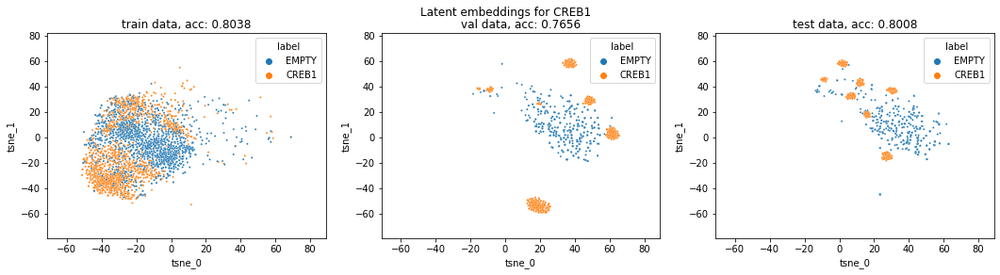

Visualize latent spaces:  37%|███▋      | 16/43 [03:37<05:15, 11.68s/it]

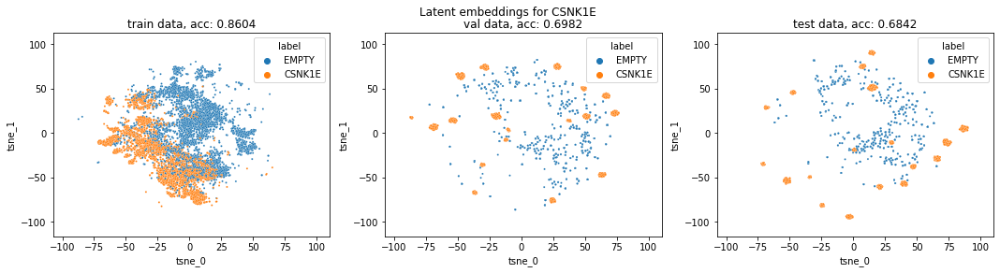

Visualize latent spaces:  40%|███▉      | 17/43 [04:01<06:33, 15.15s/it]

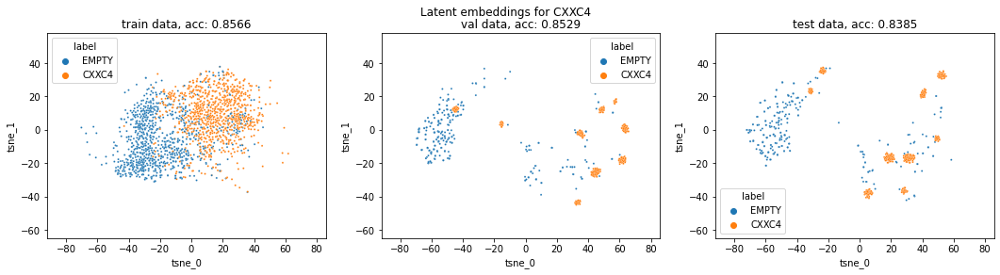

Visualize latent spaces:  42%|████▏     | 18/43 [04:06<05:09, 12.39s/it]

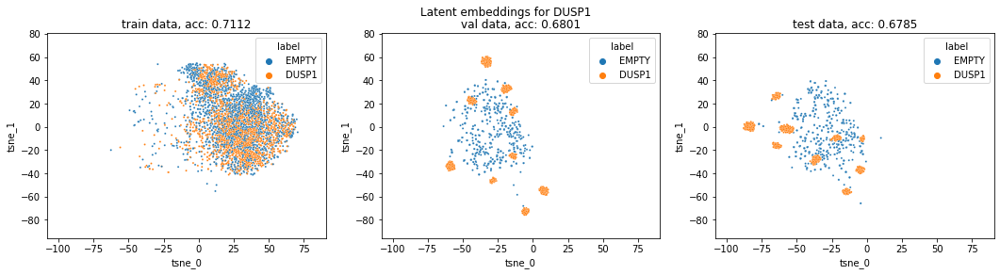

Visualize latent spaces:  44%|████▍     | 19/43 [04:19<04:55, 12.31s/it]

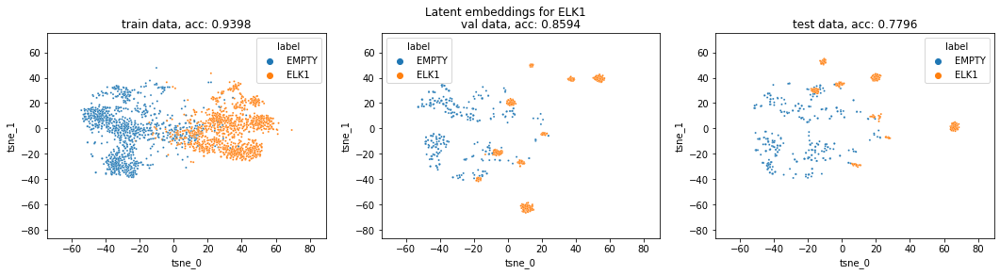

Visualize latent spaces:  47%|████▋     | 20/43 [04:25<04:03, 10.60s/it]

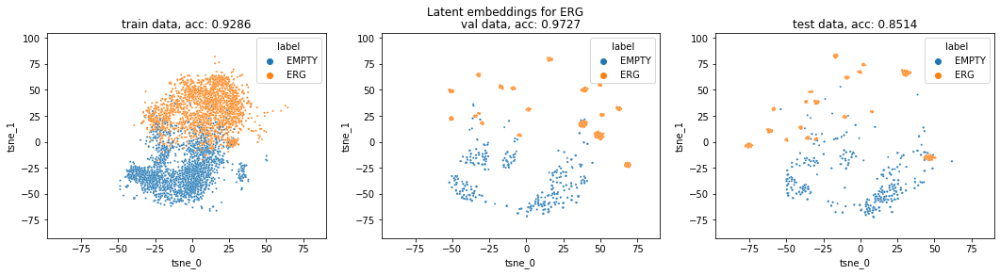

Visualize latent spaces:  49%|████▉     | 21/43 [04:36<03:57, 10.80s/it]

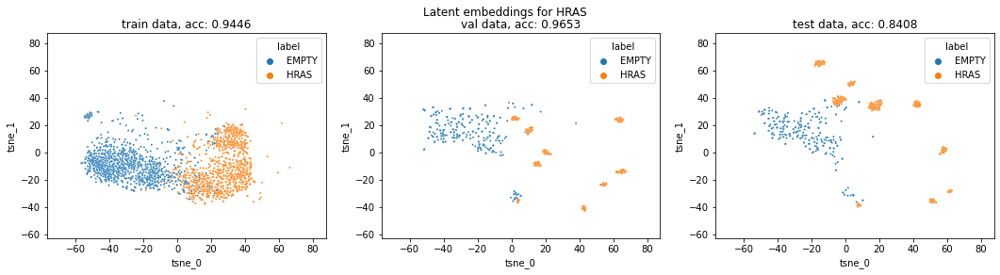

Visualize latent spaces:  51%|█████     | 22/43 [04:43<03:17,  9.39s/it]

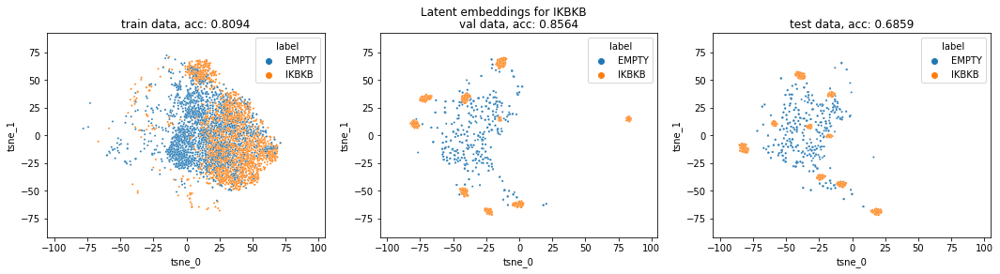

Visualize latent spaces:  53%|█████▎    | 23/43 [04:59<03:51, 11.58s/it]

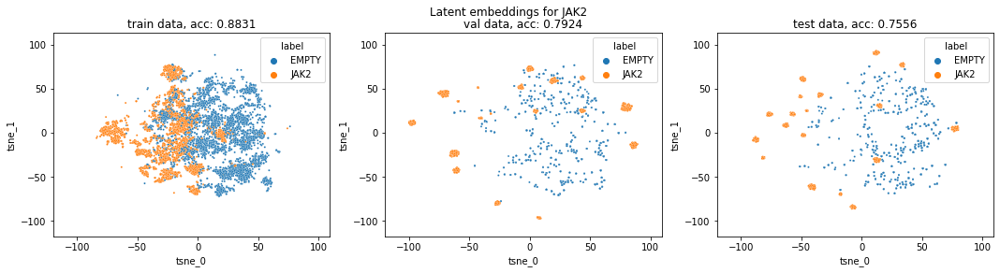

Visualize latent spaces:  56%|█████▌    | 24/43 [05:22<04:41, 14.83s/it]

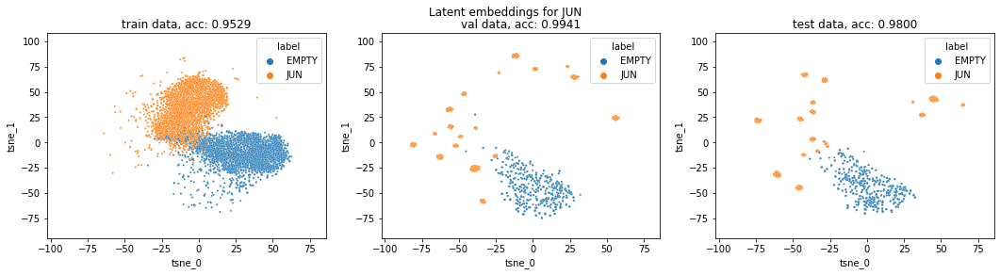

Visualize latent spaces:  58%|█████▊    | 25/43 [05:38<04:34, 15.22s/it]

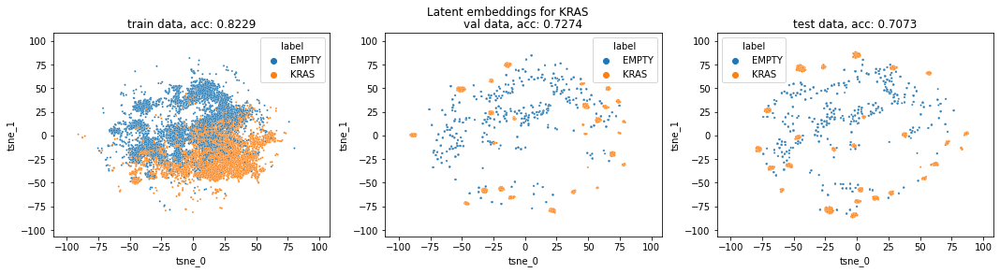

Visualize latent spaces:  60%|██████    | 26/43 [06:09<05:38, 19.90s/it]

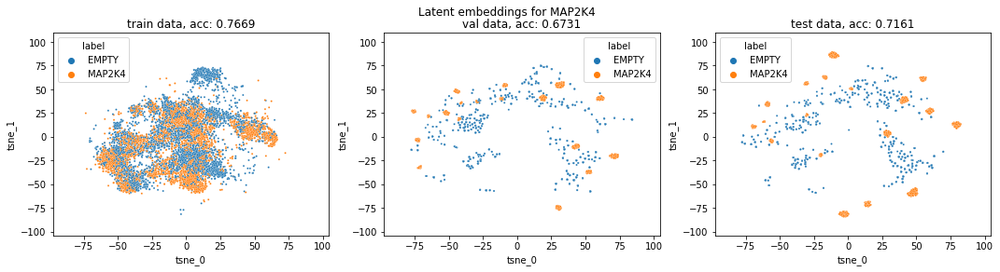

Visualize latent spaces:  63%|██████▎   | 27/43 [06:37<05:59, 22.45s/it]

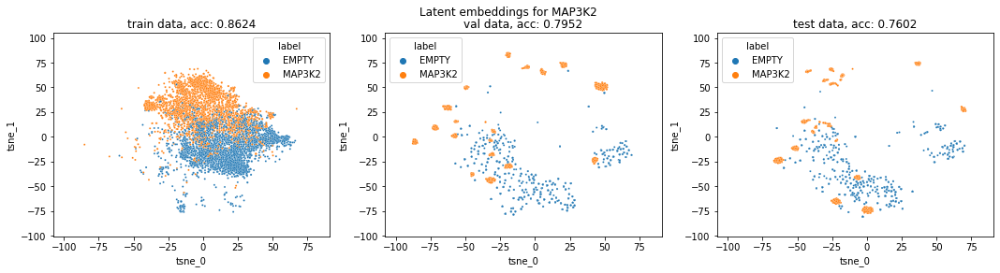

Visualize latent spaces:  65%|██████▌   | 28/43 [06:54<05:10, 20.67s/it]

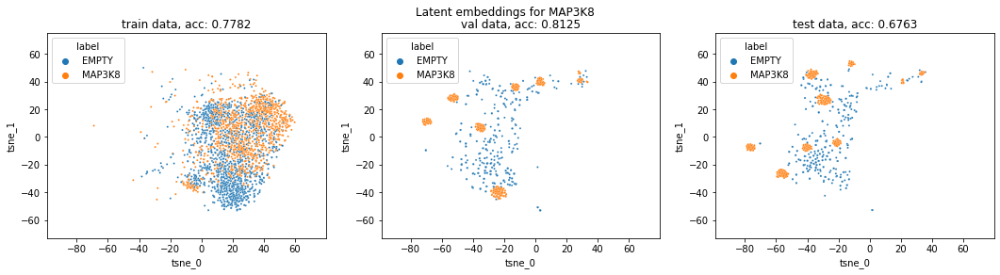

Visualize latent spaces:  67%|██████▋   | 29/43 [07:02<03:57, 16.99s/it]

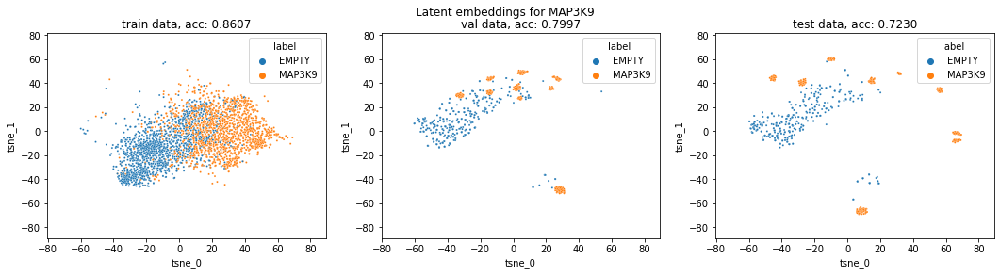

Visualize latent spaces:  70%|██████▉   | 30/43 [07:10<03:06, 14.37s/it]

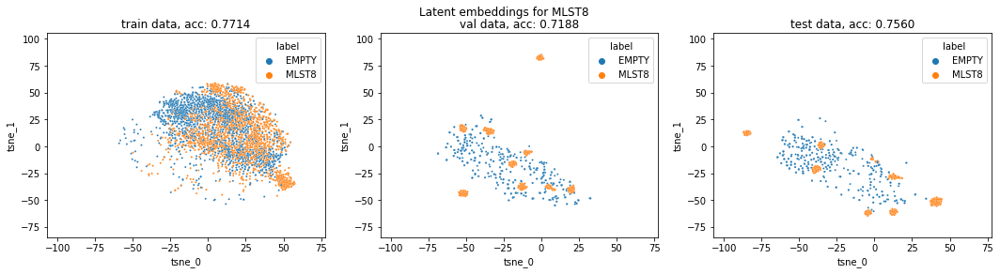

Visualize latent spaces:  72%|███████▏  | 31/43 [07:22<02:41, 13.48s/it]

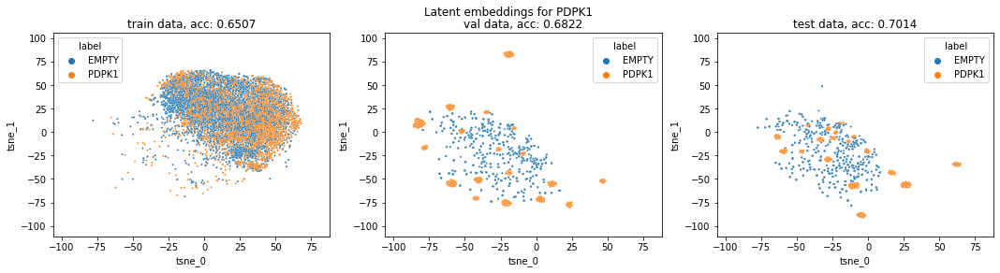

Visualize latent spaces:  74%|███████▍  | 32/43 [07:47<03:09, 17.19s/it]

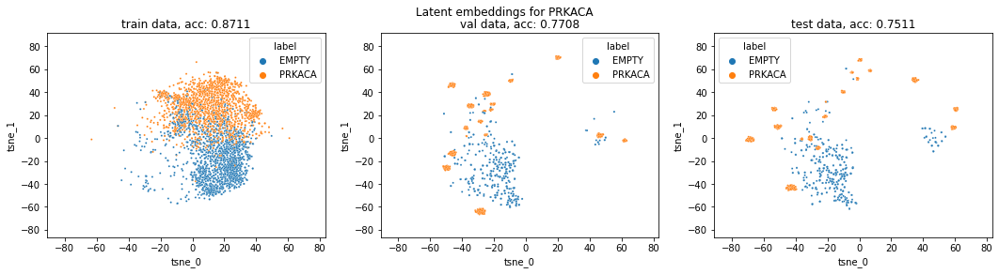

Visualize latent spaces:  77%|███████▋  | 33/43 [07:56<02:25, 14.59s/it]

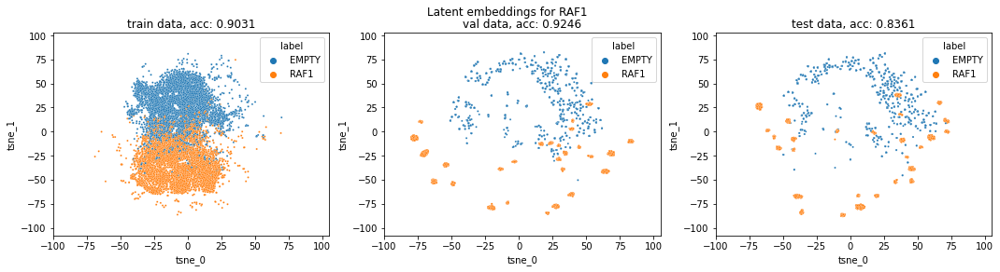

Visualize latent spaces:  79%|███████▉  | 34/43 [08:29<02:59, 19.99s/it]

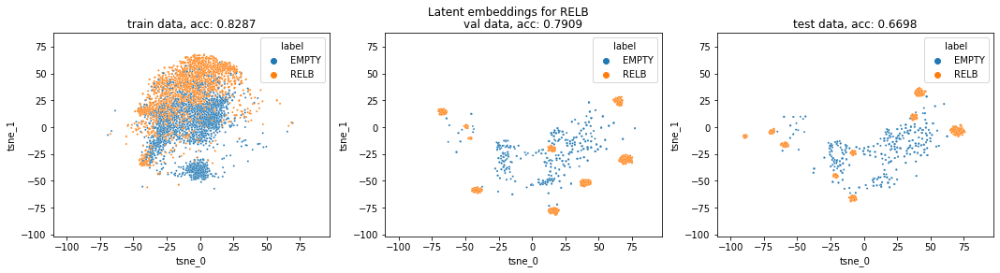

Visualize latent spaces:  81%|████████▏ | 35/43 [08:40<02:19, 17.42s/it]

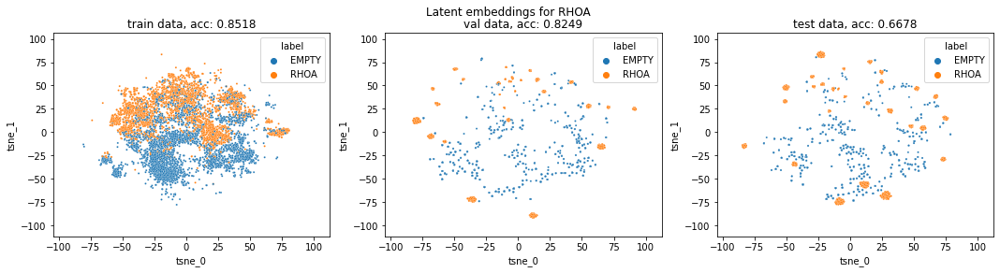

Visualize latent spaces:  84%|████████▎ | 36/43 [09:00<02:06, 18.06s/it]

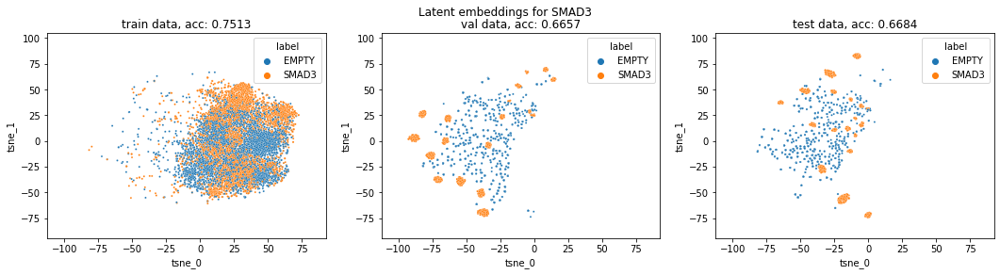

Visualize latent spaces:  86%|████████▌ | 37/43 [09:23<01:57, 19.58s/it]

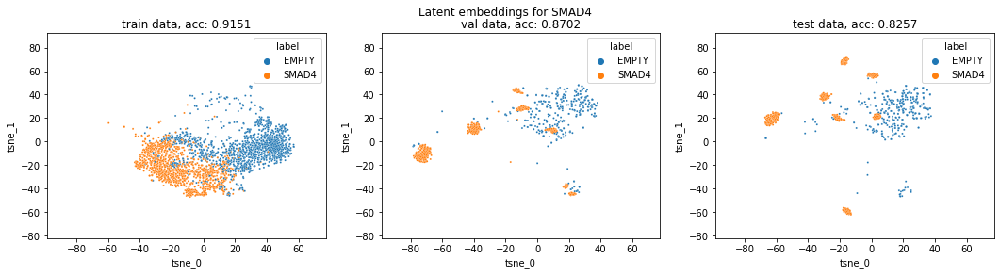

Visualize latent spaces:  88%|████████▊ | 38/43 [09:30<01:18, 15.79s/it]

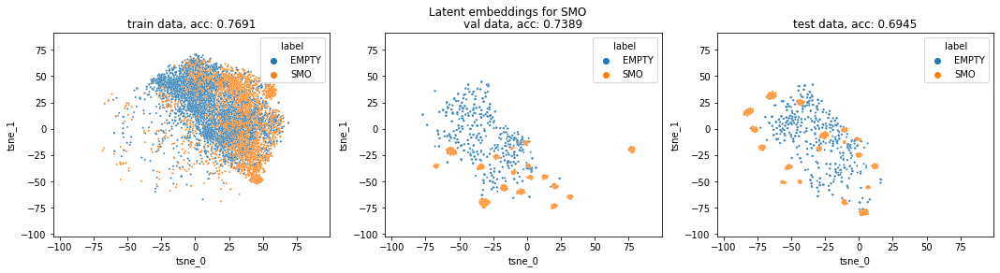

Visualize latent spaces:  91%|█████████ | 39/43 [09:49<01:07, 16.81s/it]

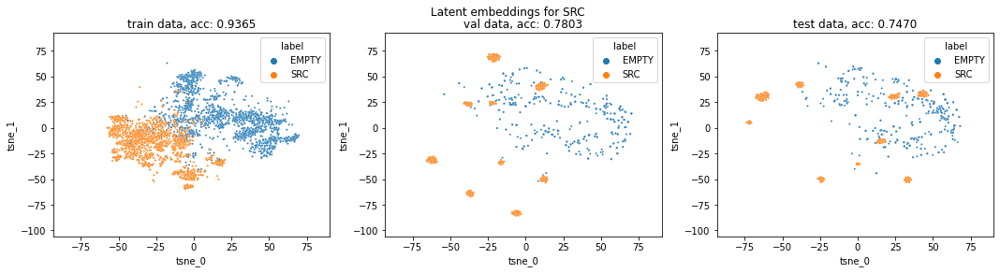

Visualize latent spaces:  93%|█████████▎| 40/43 [10:01<00:46, 15.57s/it]

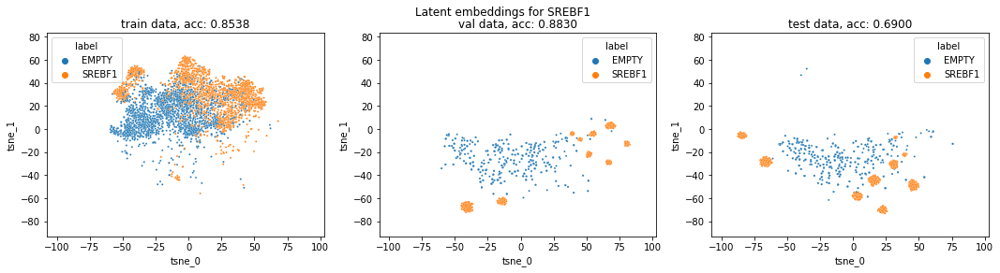

Visualize latent spaces:  95%|█████████▌| 41/43 [10:14<00:29, 14.72s/it]

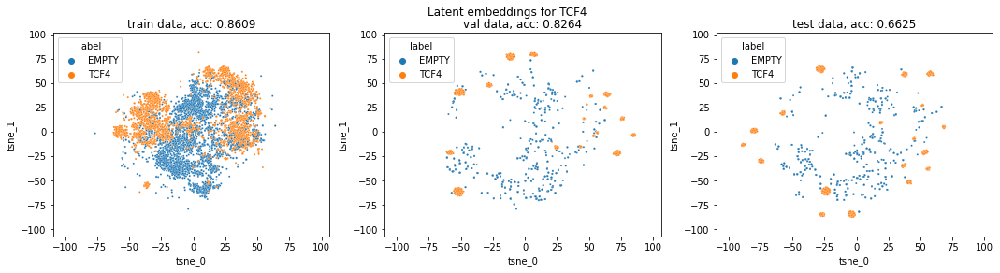

Visualize latent spaces:  98%|█████████▊| 42/43 [10:32<00:15, 15.59s/it]

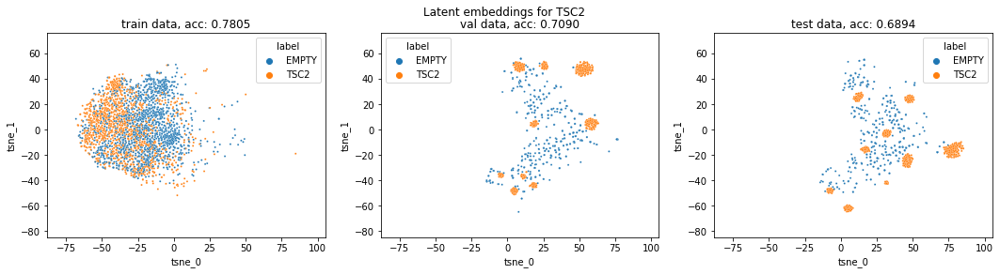

Visualize latent spaces: 100%|██████████| 43/43 [10:41<00:00, 14.91s/it]


<IPython.core.display.Javascript object>

In [25]:
plot_spec_screen_results(
    root_dir="../../../data/experiments/image_embeddings/nuclei_fov_screen_latents/",
    score_df=screen_results_multi_image,
    dataset_types=["train", "val", "test"],
    figsize=[18, 4],
)

['AKT1', 'AKT1S1', 'ATF4', 'ATG16L1', 'ATG5', 'BAMBI', 'BAX', 'BCL2L11', 'BECN1', 'BRAF', 'CASP8', 'CDC42', 'CDK2', 'CDKN1A', 'CEBPA', 'CREB1', 'CSNK1E', 'CXXC4', 'DUSP1', 'ELK1', 'ERG', 'HRAS', 'IKBKB', 'JAK2', 'JUN', 'KRAS', 'MAP2K4', 'MAP3K2', 'MAP3K8', 'MAP3K9', 'MLST8', 'PDPK1', 'PRKACA', 'RAF1', 'RELB', 'RHOA', 'SMAD3', 'SMAD4', 'SMO', 'SRC', 'SREBF1', 'TCF4', 'TSC2']


Visualize latent spaces:   0%|          | 0/43 [00:00<?, ?it/s]

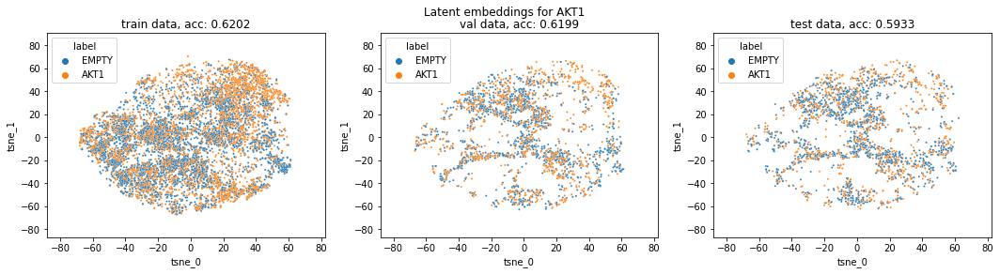

Visualize latent spaces:   2%|▏         | 1/43 [00:27<19:01, 27.19s/it]

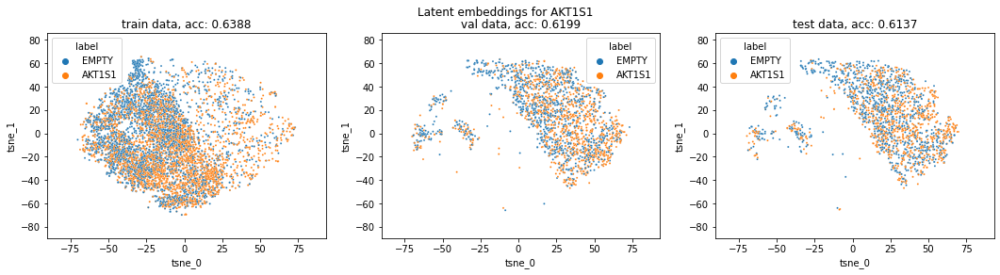

Visualize latent spaces:   5%|▍         | 2/43 [00:46<15:25, 22.56s/it]

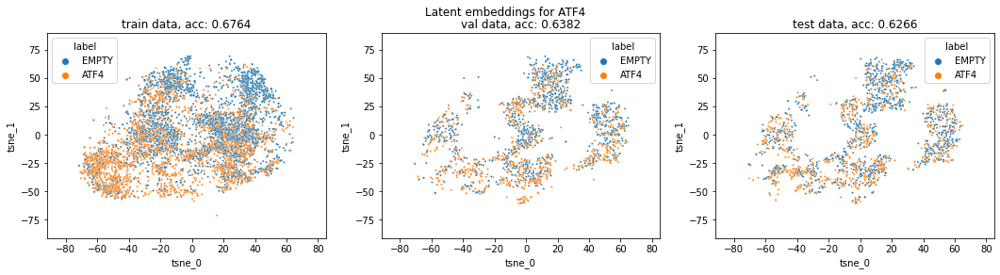

Visualize latent spaces:   7%|▋         | 3/43 [01:03<13:16, 19.90s/it]

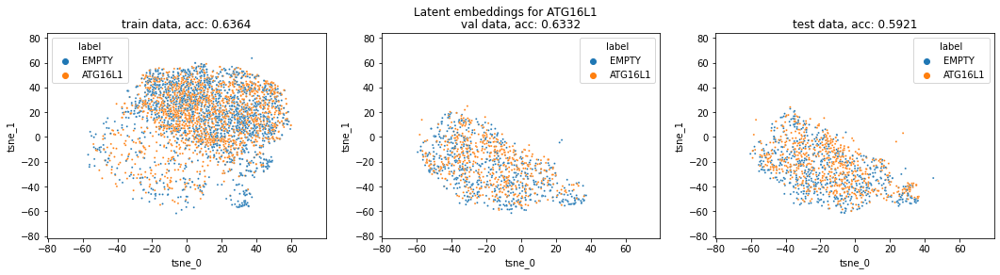

Visualize latent spaces:   9%|▉         | 4/43 [01:13<10:33, 16.24s/it]

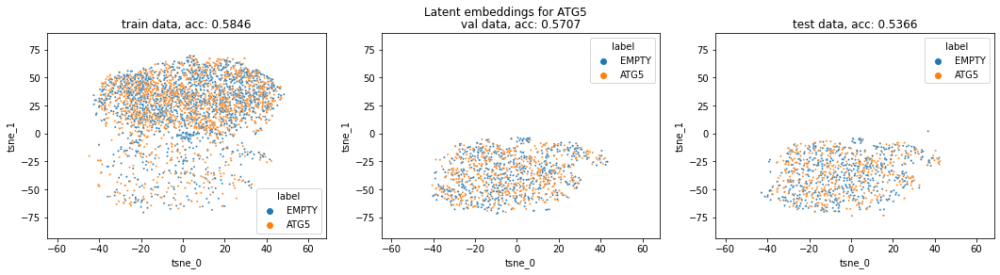

Visualize latent spaces:  12%|█▏        | 5/43 [01:23<08:50, 13.96s/it]

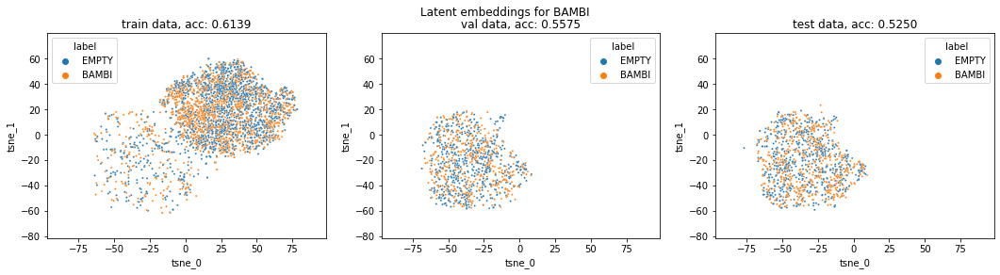

Visualize latent spaces:  14%|█▍        | 6/43 [01:33<07:39, 12.43s/it]

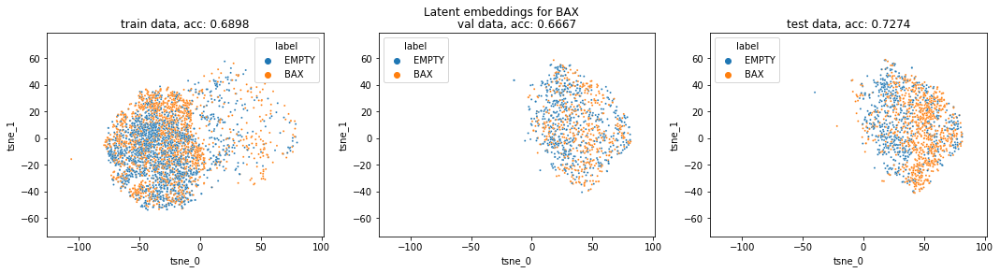

Visualize latent spaces:  16%|█▋        | 7/43 [01:44<07:12, 12.03s/it]

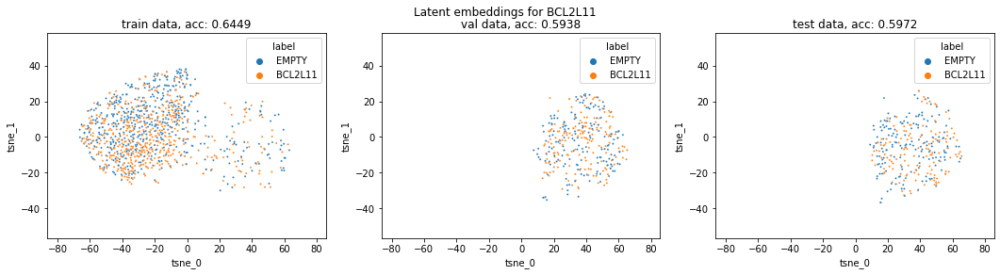

Visualize latent spaces:  19%|█▊        | 8/43 [01:47<05:25,  9.30s/it]

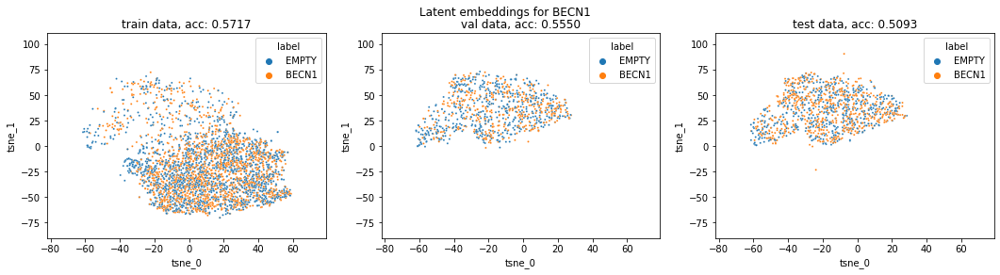

Visualize latent spaces:  21%|██        | 9/43 [01:58<05:25,  9.59s/it]

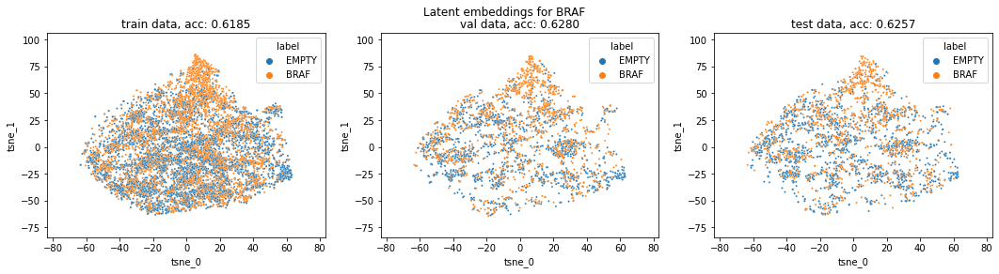

Visualize latent spaces:  23%|██▎       | 10/43 [02:31<09:19, 16.95s/it]

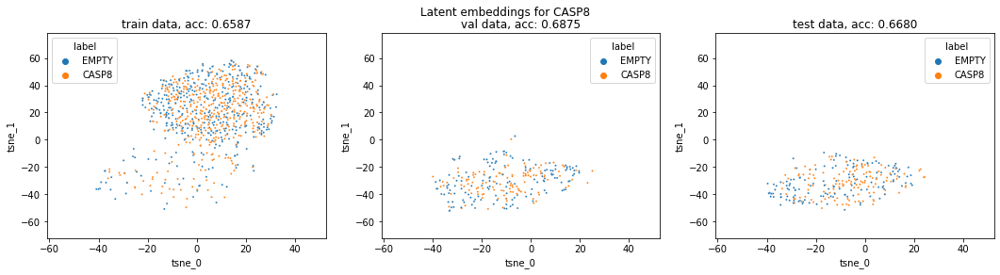

Visualize latent spaces:  26%|██▌       | 11/43 [02:35<06:56, 13.00s/it]

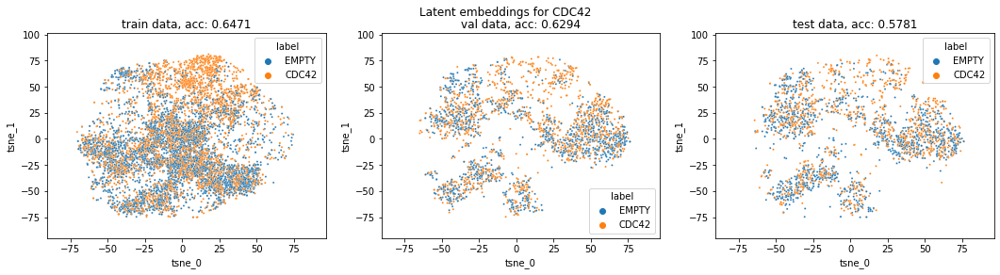

Visualize latent spaces:  28%|██▊       | 12/43 [03:01<08:45, 16.95s/it]

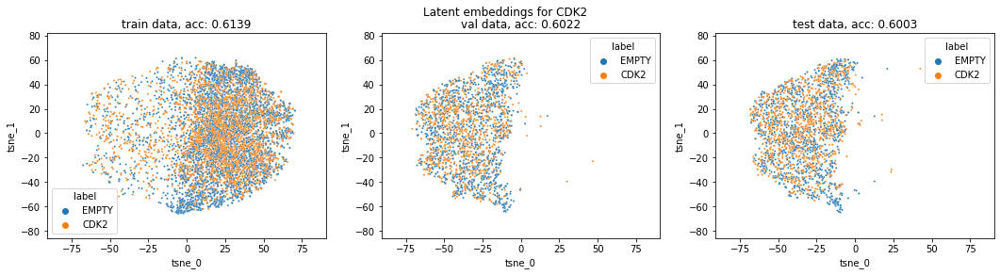

Visualize latent spaces:  30%|███       | 13/43 [03:27<09:54, 19.81s/it]

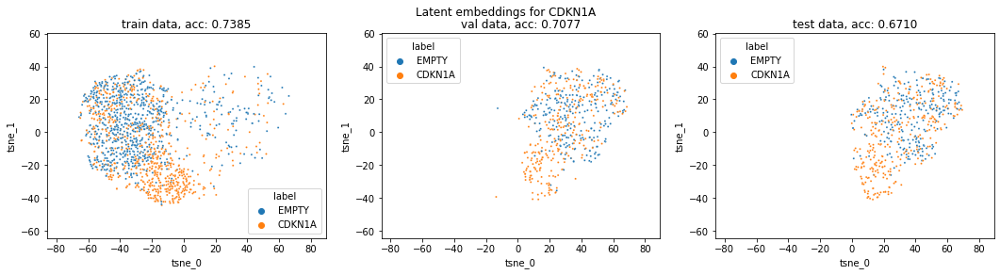

Visualize latent spaces:  33%|███▎      | 14/43 [03:33<07:32, 15.62s/it]

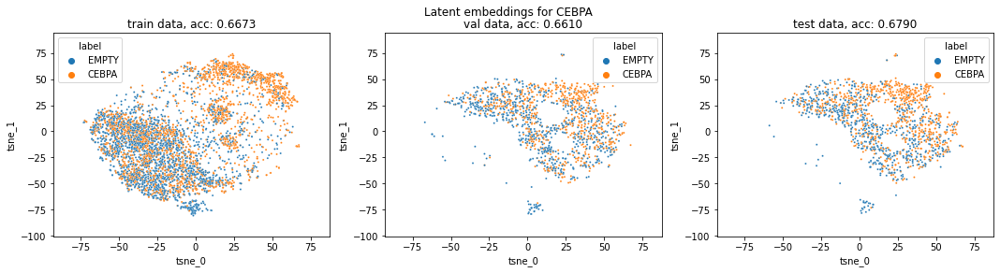

Visualize latent spaces:  35%|███▍      | 15/43 [03:48<07:10, 15.38s/it]

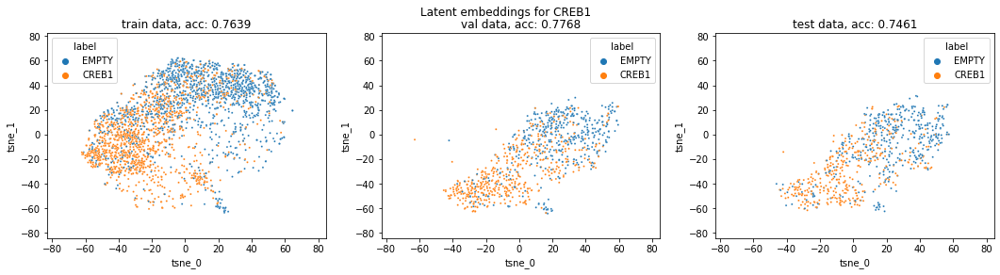

Visualize latent spaces:  37%|███▋      | 16/43 [03:57<06:00, 13.37s/it]

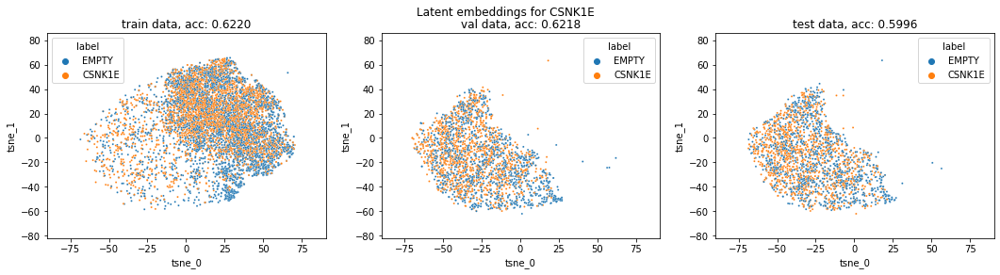

Visualize latent spaces:  40%|███▉      | 17/43 [04:21<07:09, 16.52s/it]

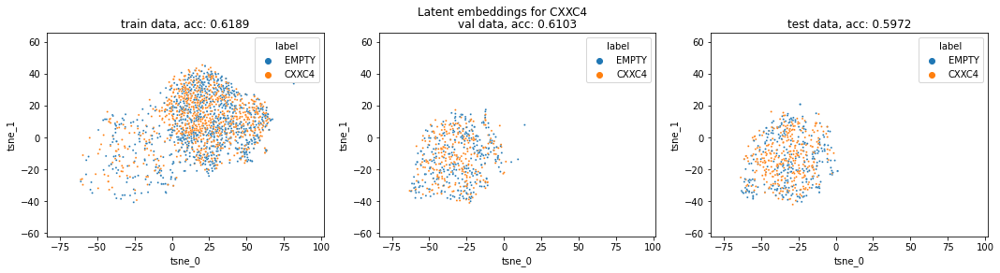

Visualize latent spaces:  42%|████▏     | 18/43 [04:27<05:38, 13.52s/it]

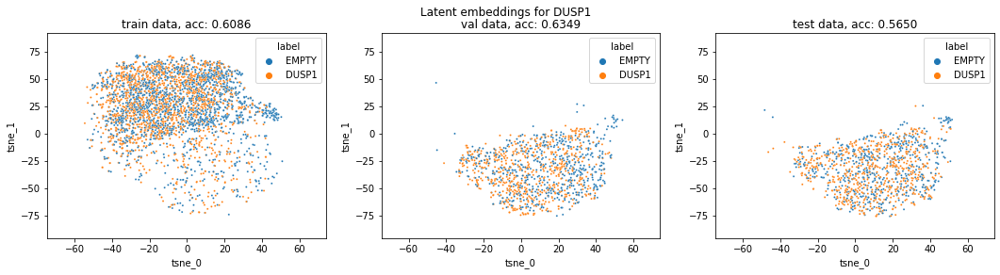

Visualize latent spaces:  44%|████▍     | 19/43 [04:40<05:16, 13.17s/it]

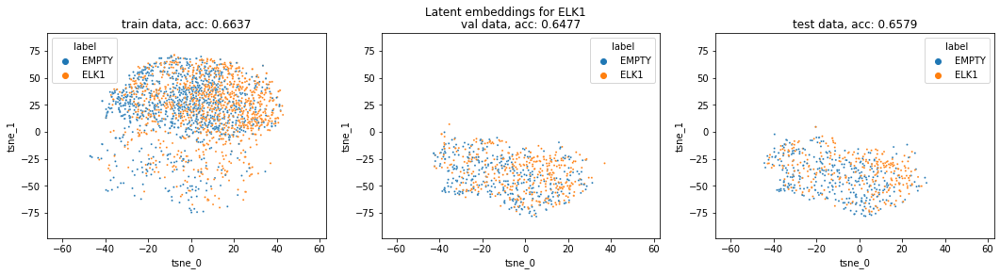

Visualize latent spaces:  47%|████▋     | 20/43 [04:47<04:20, 11.33s/it]

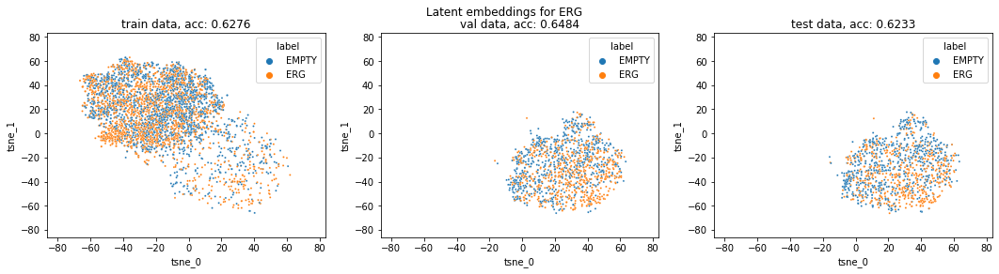

Visualize latent spaces:  49%|████▉     | 21/43 [04:59<04:15, 11.60s/it]

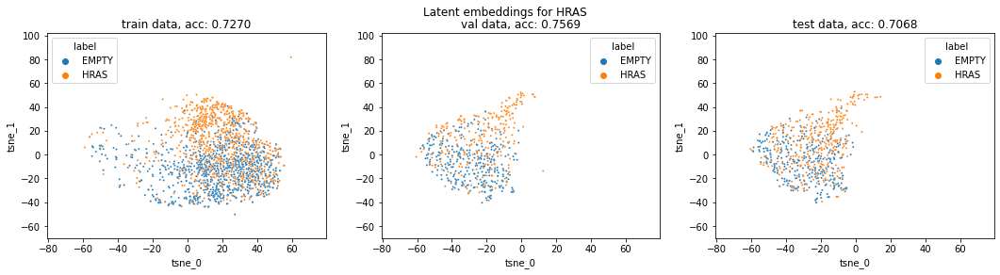

Visualize latent spaces:  51%|█████     | 22/43 [05:06<03:32, 10.12s/it]

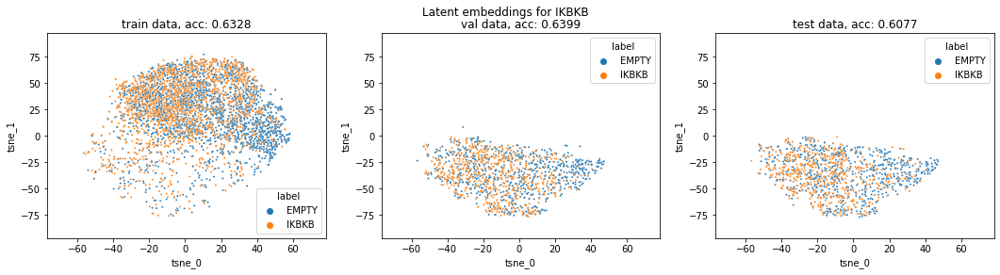

Visualize latent spaces:  53%|█████▎    | 23/43 [05:20<03:45, 11.29s/it]

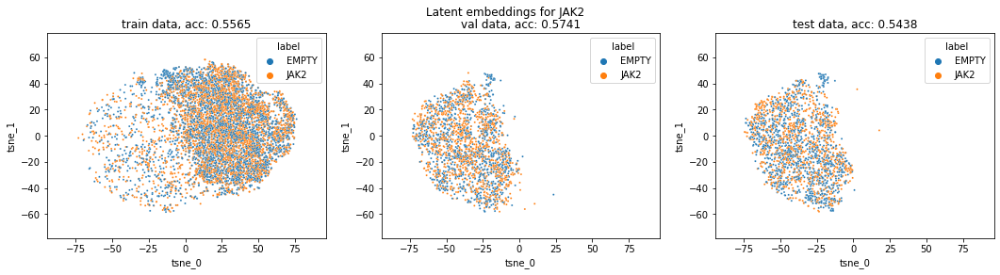

Visualize latent spaces:  56%|█████▌    | 24/43 [05:45<04:55, 15.55s/it]

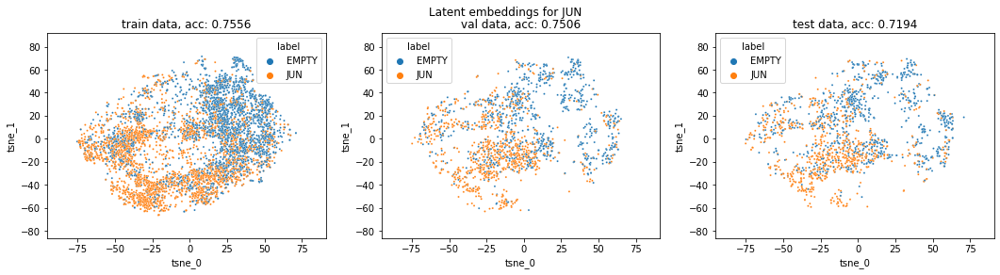

Visualize latent spaces:  58%|█████▊    | 25/43 [06:01<04:42, 15.68s/it]

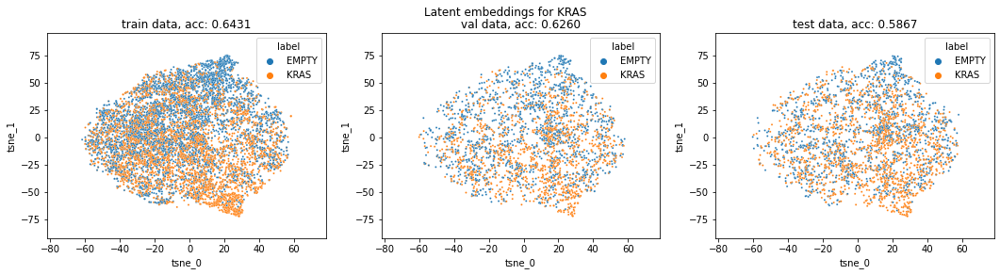

Visualize latent spaces:  60%|██████    | 26/43 [06:43<06:37, 23.40s/it]

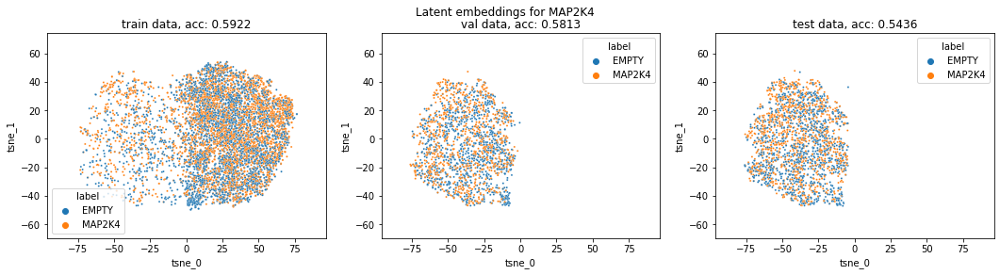

Visualize latent spaces:  63%|██████▎   | 27/43 [07:05<06:12, 23.27s/it]

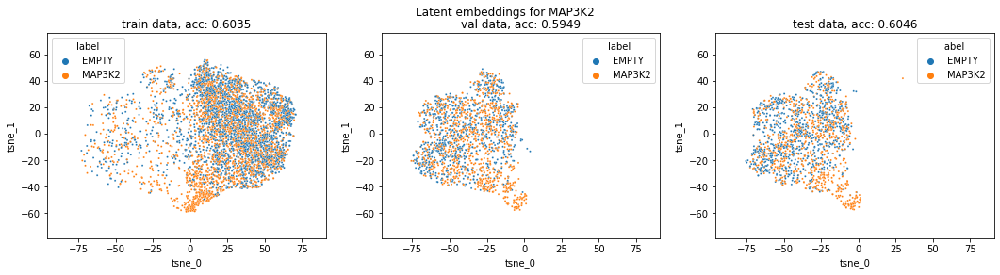

Visualize latent spaces:  65%|██████▌   | 28/43 [07:21<05:12, 20.84s/it]

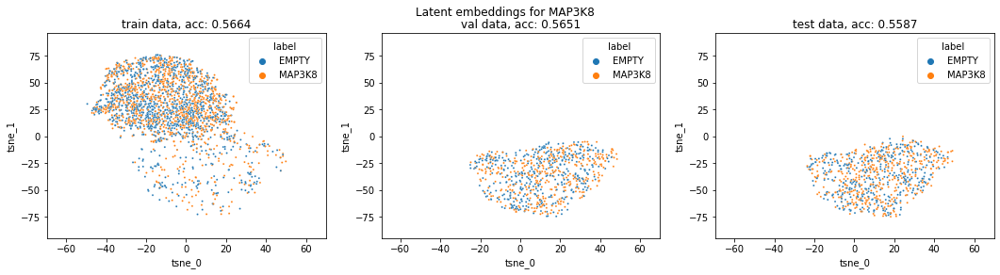

Visualize latent spaces:  67%|██████▋   | 29/43 [07:28<03:54, 16.73s/it]

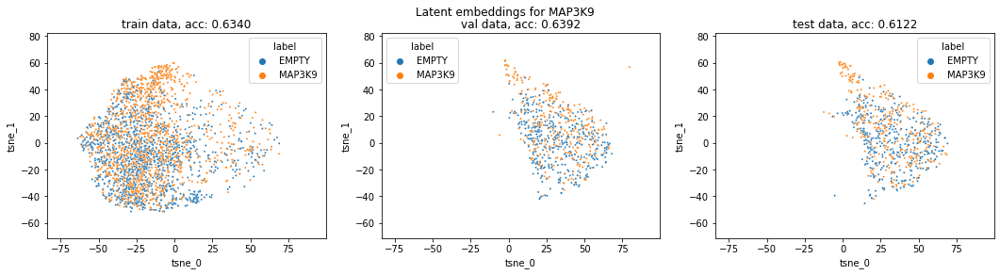

Visualize latent spaces:  70%|██████▉   | 30/43 [07:36<03:04, 14.19s/it]

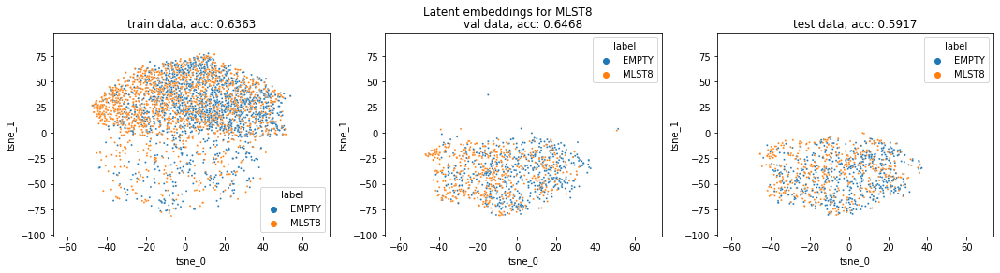

Visualize latent spaces:  72%|███████▏  | 31/43 [07:46<02:36, 13.05s/it]

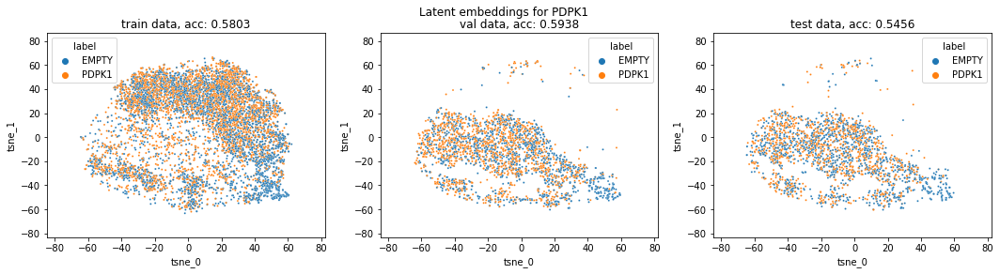

Visualize latent spaces:  74%|███████▍  | 32/43 [08:10<02:56, 16.07s/it]

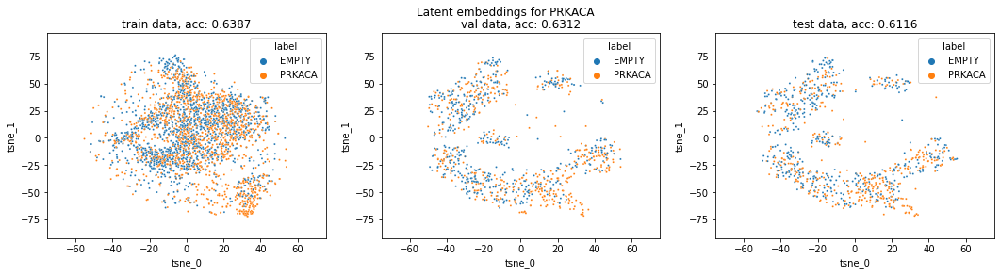

Visualize latent spaces:  77%|███████▋  | 33/43 [08:19<02:19, 13.96s/it]

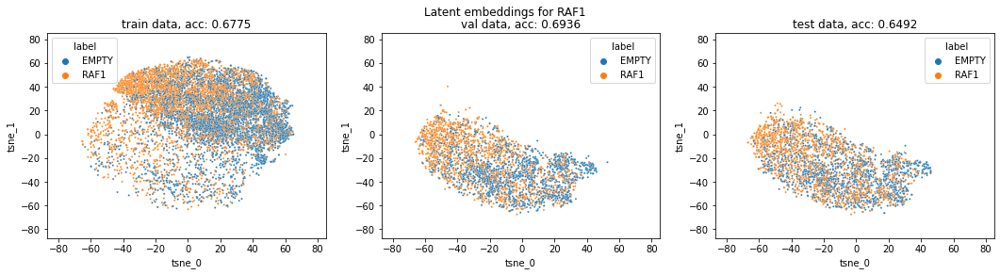

Visualize latent spaces:  79%|███████▉  | 34/43 [08:50<02:51, 19.10s/it]

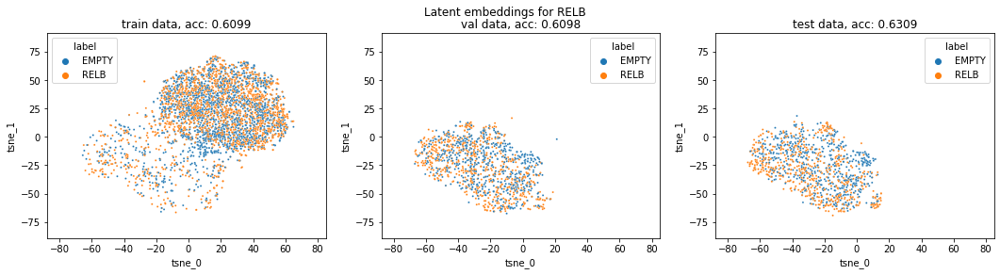

Visualize latent spaces:  81%|████████▏ | 35/43 [09:02<02:16, 17.03s/it]

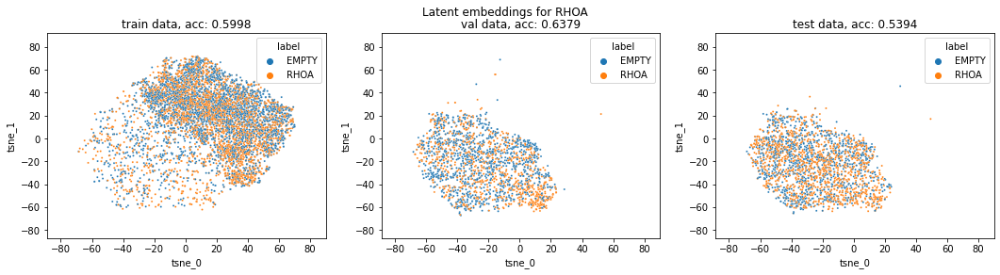

Visualize latent spaces:  84%|████████▎ | 36/43 [09:23<02:07, 18.17s/it]

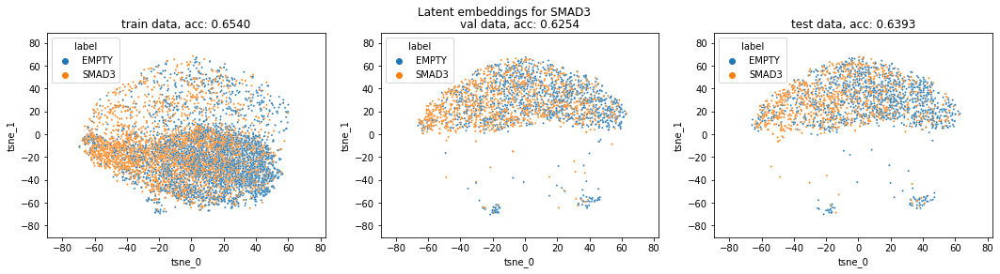

Visualize latent spaces:  86%|████████▌ | 37/43 [09:49<02:04, 20.67s/it]

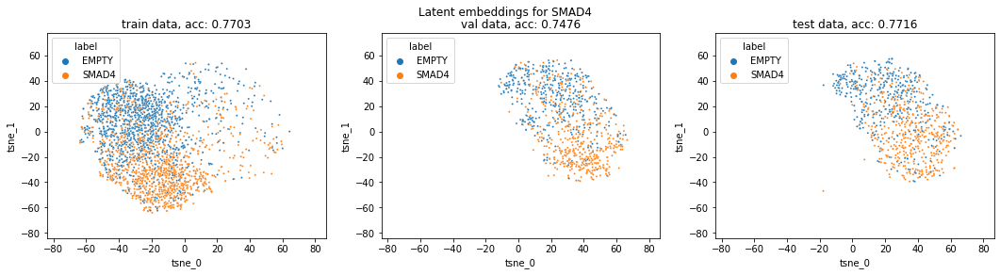

Visualize latent spaces:  88%|████████▊ | 38/43 [09:58<01:25, 17.06s/it]

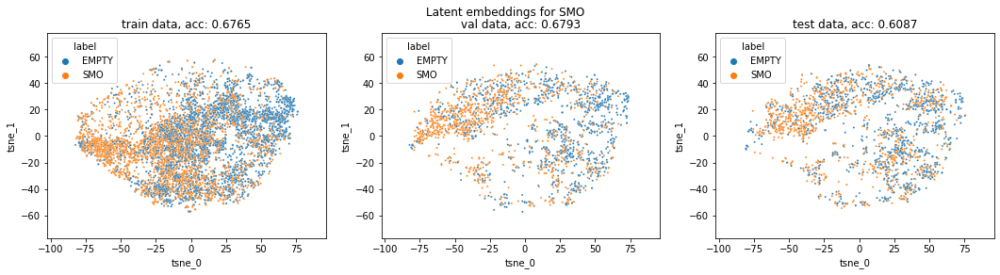

Visualize latent spaces:  91%|█████████ | 39/43 [10:23<01:17, 19.34s/it]

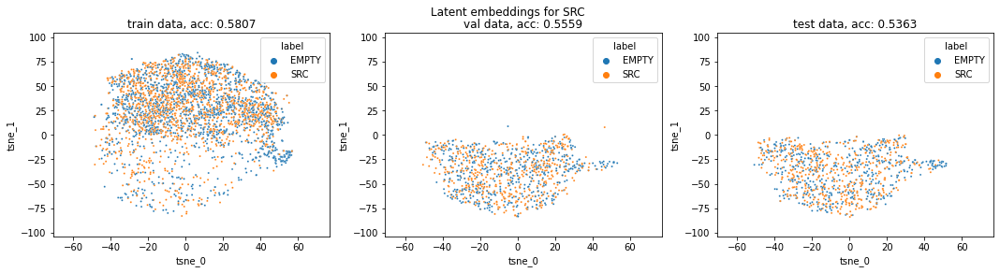

Visualize latent spaces:  93%|█████████▎| 40/43 [10:34<00:51, 17.02s/it]

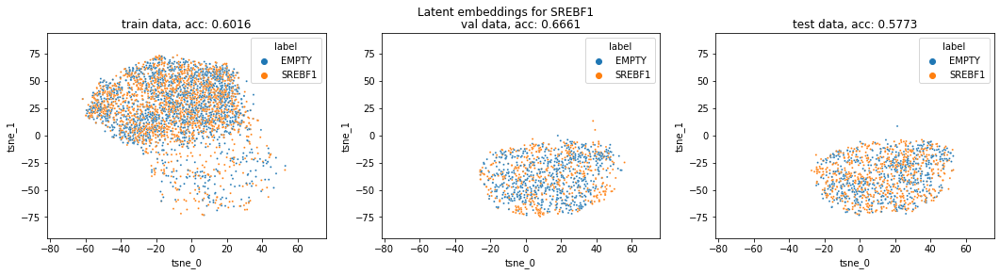

Visualize latent spaces:  95%|█████████▌| 41/43 [10:47<00:31, 15.65s/it]

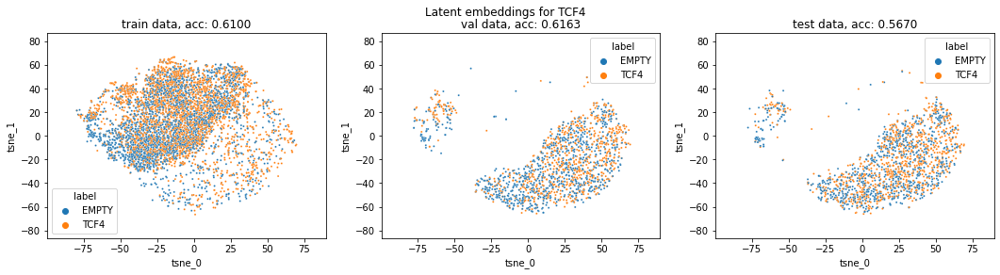

Visualize latent spaces:  98%|█████████▊| 42/43 [11:14<00:19, 19.04s/it]

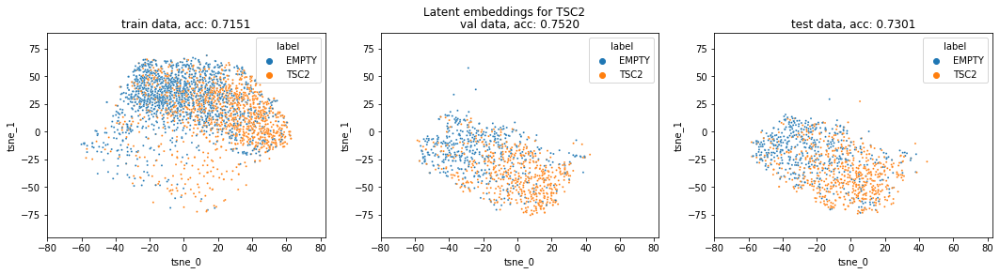

Visualize latent spaces: 100%|██████████| 43/43 [11:23<00:00, 15.90s/it]


<IPython.core.display.Javascript object>

In [25]:
plot_spec_screen_results(
    root_dir="../../../data/experiments/image_embeddings/nuclei_screen_latents/",
    score_df=screen_results_nuclei,
    dataset_types=["train", "val", "test"],
    figsize=[18, 4],
)